# Relative and Absolute Dating

IN THE SPACE BELOW, WRITE OUT IN FULL AND THEN SIGN THE HONOR PLEDGE:

“I pledge my honor that I have not violated the honor code during this examination.”

**PRINT NAME**: 

If a fellow student has contributed significantly to this work, please acknowledge them here:

**Peer(s)**:                          

*Contribution:*


By uploading this assignment through Canvas, I sign off on the document below electronically.

----

## Part I: Grand Canyon and the Great Unconformity

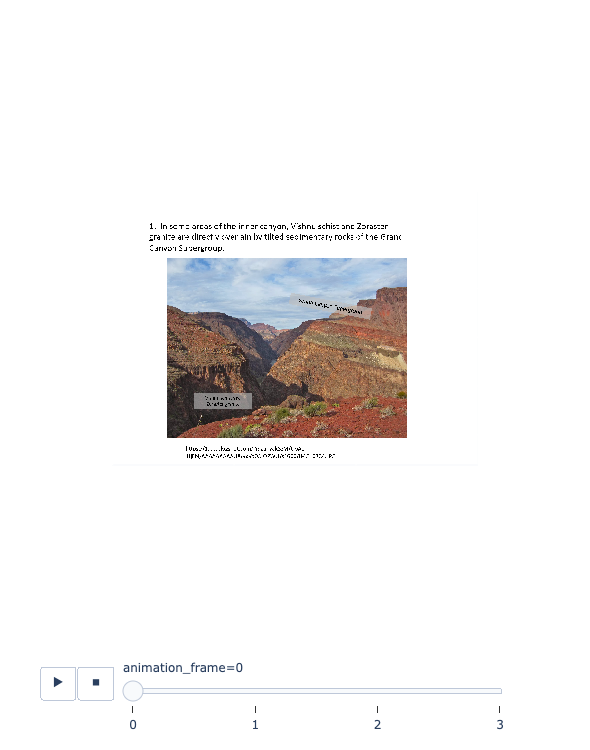

In [19]:
import os,re, IPython
import plotly.express as px
from skimage import io
import numpy as np

# Specify folder containing Slides*.png
folder = 'Files/Grand_Canyon_Images'

# create list of png files
files = []
for (roots,dirs,file) in os.walk(folder):
    if roots==folder:
        for f in file: 
            if f.endswith('.png'): files.append(f)
files.sort(key=lambda f: int(re.sub('\D','',f))) # sort by number of slide

num_slides = len(files)
for slide, image_file in enumerate(files):
    image_file = folder+'/'+image_file
    img = io.imread(image_file)
    if len(img.shape) == 2: img = color.gray2rgb(img) # convert b/w to rgb
    
    #slide_deck.shape (Nimg, y, x) for monochrome. (Nimg, y, x, 3) for RGB color.
    if slide == 0: slide_deck = np.zeros([num_slides,img.shape[0],img.shape[1],img.shape[2]])
    slide_deck[slide] = img
    
fig = px.imshow(slide_deck, animation_frame=0,binary_string=True, 
                binary_format='png', binary_compression_level=3,
                width=img.shape[1]/1.5, height=img.shape[0]/1.5)
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 2000
fig.show()    

----
## Part II: Age of the Earth

In this question, you will be carrying out a famous set of geochronological calculations by Patterson (1956) - the first correct age of the Earth. Read Patterson (1956). This paper is commonly cited as the first correct determination of the age of the Earth (estimates now are about 4.567 Ga).

<img src="Photos/CPatterson.jpeg" alt="drawing" width="40%"/>

*A picture of Claire Patterson. Source: Caltech Archives*


<img src="Photos/Patterson+56_Thumbnail.png" alt="drawing" width="70%"/>

*The first page from Patterson (1956) paper.*

### Mini-tutorial

 - **Opening text (*.txt) files with pandas**
 - **Basic curve fitting with numpy**
 - **Basic scatter and line plots with matplotlib**

You will need to use the Python programming language for problems that require computations and for making plots in this class. 

Here is an example of fitting some data and making a plot. We will read a data file, perform linear regression, and make a plot. Most of the time, your code will begin by importing libraries such as `numpy` (for vector calculation), `pandas` (for reading tables and other files), and `matplotlib.pyplot` (for making plots). If you are not familar with these libraries, feel free to follow examples in the previous precepts or the tutorial online for [numpy](https://www.w3schools.com/python/numpy/default.asp) and [matplotlib](https://matplotlib.org/stable/tutorials/index.html).


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

<div class="admonition pythonreview" name="html-admonition" style="background: lightgreen; padding: 10px">
<p class="title">Python Review</p>
<p>Reading columnar data with Pandas: Note the line `table = pd.read_table("example-data.txt")`; is how you read a data file into a Pandas DataFrame, which is a 2 dimensional data structure, like a 2 dimensional array or a table with rows and columns.</p>
</div>

First, let us create an example dataset that will be used in the curve fitting exercise. The basic form of a line is `y=m*x+b` where `m` is the slope and `b` is the intercept of the line on the y-axis. We are adding a bit of noise from a normal distribution to make numpy work a bit harder! We will check later if the fitted values numpy gives for `m` and `b` are similar to what we started off with `y = 5x + 3.5 + random noise`. Data are saved to a text file `example-data.txt` with columns for `x` and `y`. We are going to read this file and fit a straight line.

In [2]:
# pandas read_table allows you to read a table of any structure
# useful when you are not sure how to read the file
table = pd.read_table("Files/example-data.txt")

# displays the table we have just read
table

,x,y
0,5.553,22.818
1,6.735,39.294
2,7.780,48.010
3,10.542,64.029
4,10.870,54.845
5,11.499,48.524
6,16.689,87.874
7,19.600,114.331
8,20.703,101.660
9,22.550,121.006


In [3]:
# access a column of the table by using column's header as a key
table['x']

0      5.553
1      6.735
2      7.780
3     10.542
4     10.870
5     11.499
6     16.689
7     19.600
8     20.703
9     22.550
10    23.762
11    24.092
Name: x, dtype: float64

<div class="admonition pythonreview" name="html-admonition" style="background: lightgreen; padding: 10px">
<p class="title">Python Review</p>
<p>Note the line `p = np.polyfit(x, y, 1)`. This is where we fit the line. The value `1` indicates that we fit a first-order polynomial.</p>
</div>

In [4]:
# One example on how to fit a line using numpy polyfit
x = np.array(table['x'])
y = np.array(table['y'])

p = np.polyfit(x, y, 1)

# y-value of the best-fitted line
y_fit = p[0] * x + p[1]

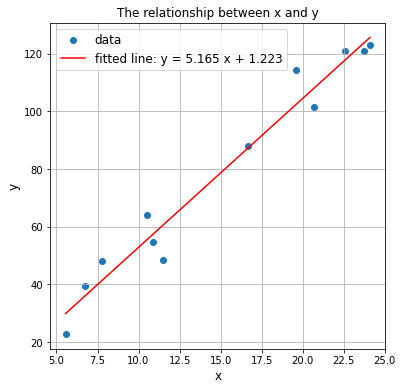

In [5]:
# Basic steps on how to make a plot using matplotlib

# creates a figure
fig = plt.figure(figsize=[6,6])

# makes a scatter plot
plt.scatter(x, y, label='data')

# makes a line plot
text = "fitted line: y = %.3f x + %.3f"%(p[0], p[1])
plt.plot(x, y_fit, 'r', label=text)

# labels the axes 
plt.xlabel('x', fontsize=12)
plt.ylabel('y', fontsize=12)
plt.title('The relationship between x and y', fontsize=12)

# adds grid lines
plt.grid()

# adds a legend box
plt.legend(fontsize=12)

# shows the figure
plt.show()

**Note**: The value numpy calculated for `m` (5.165) and `b` (1.223) was slightly different from what we started with (5 and 3.5).

### TO DO

**Question 1.1**. Using the data in Table 1 from that paper (this is also saved as the uploaded file PS1-data.txt), find the slope in Equation 1 from the Patterson paper. Choose the appropriate data to make a scatter plot with a fitted line like in the mini-tutorial and show your code and a plot. 

If you do not know which data you need to choose, think about what could be the slope in the Equation 1. Report the slope of the fitted line a the variable `fit_slope` below.

**Answer**

<br/><br/>
<br/><br/>

In [1]:
# Fill slope you have found from the data here
#fit_slope = 

**Question 1.2**. Recalculate Patterson’s age of the Earth based on the slope. You will need to use the `fit_slope` obtained in Question 1.1. You should also use the same values as Patterson did for $\lambda_{238}$, $\lambda_{235}$ (from Patterson (1956) paper, equation (1)), and present day $\frac{^{238}\text{U}}{^{235}\text{U}}$.

In [2]:
# The values Patterson used for the calculation
lambda_235 = 9.72e-10      # Decay constant of U-235 in yr^-1
lambda_238 = 1.537e-10     # Decay constant of U-238 in yr^-1
k = 137.8                  # U-238 / U-235 today

You may use this piece of code below to determine the age of Earth. Here we are finding the age of the Earth where the Equation 1 from the Patterson (1956) is satisfied for the slope you have found from the data.

In [13]:
from scipy import optimize

def get_difference(age, reference_slope):
    '''
    Compute the difference of the right-hand side and the left-hand side of Equation 1 from Patterson (1956)
    
    Input Parameters:
    ----------------
    
    age:               age of the Earth in years
    reference_slope:   the slope obtained from fitting the data
    
    Return:
    ------
    
    difference:        difference of the right-hand side and the left-hand side of Equation 1 from Patterson (1956)
    
    '''
    lambda_235 = 9.72e-10     # Decay constant of U-235 in yr^-1
    lambda_238 = 1.537e-10    # Decay constant of U-235 in yr^-1
    k = 137.8                 # U-238 / U-235 today
    difference = (np.exp(lambda_235*age) - 1) / (k * (np.exp(lambda_238*age) - 1)) - reference_slope
    return difference

In [14]:
# Set these parameter to appropriate values ONLY when the age of the Earth makes no sense (e.g. -5 years)
age_lower = 1e1       # The lower bound for the bracket (unit: year)
age_upper = 14e9      # The upper bound for the bracket (unit: year)

# Determine the age of the Earth
#sol = optimize.root_scalar(get_difference, args=fit_slope, bracket=[age_lower, age_upper], method='brentq')

**Answer**:

<br/><br/>
<br/><br/>

In [2]:
# Display the age of the Earth in years
# print("The Earth is %.4g years old."%sol.root)

**Question 2**. How does Patterson justify that the age of Earth is the same as the meteorites’ ?

**Answer**:

<br/><br/>
<br/><br/>

**Question 3**. What are the three assumptions that need to be met in order for an isochron to be meaningful? Do you think this is met for Patterson’s meteorites? (You may answer this qualitatively.)

**Answer**:

<br/><br/>
<br/><br/>